# Object detection
- Task / issue: https://github.com/shreydan/computer-vision-course/issues/8
- Model: https://huggingface.co/google/owlvit-base-patch32

## ToDo
- Use proper dataset, e.g., https://huggingface.co/datasets/detection-datasets/coco
- draw multiple boxes
- Add markdown to describe what's going on.

In [1]:
# https://huggingface.co/google/owlvit-base-patch32
import torch
import requests
from PIL import Image, ImageDraw
# https://huggingface.co/google/owlvit-base-patch32
from transformers import OwlViTProcessor, OwlViTForObjectDetection

processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
model = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)
texts = [["a photo of a cat", "a photo of a dog"]]
inputs = processor(text=texts, images=image, return_tensors="pt")
outputs = model(**inputs)

# Target image sizes (height, width) to rescale box predictions [batch_size, 2]
target_sizes = torch.Tensor([image.size[::-1]])
# Convert outputs (bounding boxes and class logits) to COCO API
results = processor.post_process_object_detection(outputs=outputs, threshold=0.1, target_sizes=target_sizes)

i = 0  # Retrieve predictions for the first image for the corresponding text queries
text = texts[i]
boxes, scores, labels = results[i]["boxes"], results[i]["scores"], results[i]["labels"]

# Print detected objects and rescaled box coordinates
for box, score, label in zip(boxes, scores, labels):
    box = [round(i, 2) for i in box.tolist()]
    print(f"Detected {text[label]} with confidence {round(score.item(), 3)} at location {box}")

Detected a photo of a cat with confidence 0.707 at location [324.97, 20.44, 640.58, 373.29]
Detected a photo of a cat with confidence 0.717 at location [1.46, 55.26, 315.55, 472.17]


Detected a photo of a cat with confidence 0.707 at location [324.97, 20.44, 640.58, 373.29]
Detected a photo of a cat with confidence 0.717 at location [1.46, 55.26, 315.55, 472.17]


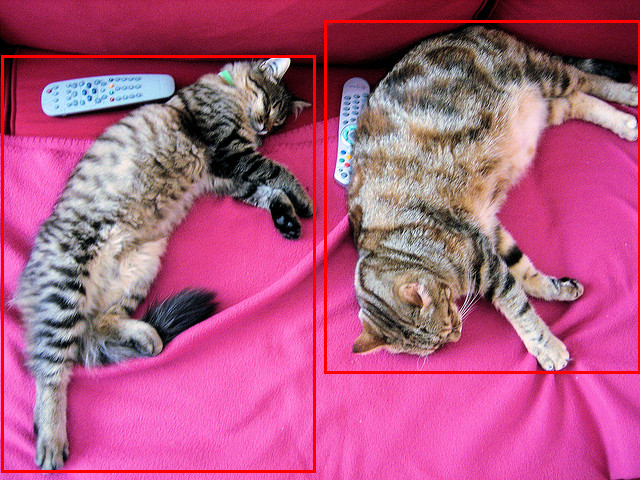

In [3]:
draw = ImageDraw.Draw(image)
box_color = "red"  # Color of the box
box_width = 3      # Width of the box edges
for box, score, label in zip(boxes, scores, labels):
    box = [round(i, 2) for i in box.tolist()]
    print(f"Detected {text[label]} with confidence {round(score.item(), 3)} at location {box}")
    draw.rectangle(box, outline=box_color, width=box_width)
image # This will display the image

https://huggingface.co/docs/transformers/main/en/model_doc/table-transformer

## Do train

In [2]:
from transformers import TrainingArguments, Trainer
from transformers import ViTForImageClassification

model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224-in21k', num_labels=10)

# Define training arguments
training_args = TrainingArguments(
    output_dir="./vit-cifar10",
    num_train_epochs=3,
    per_device_train_batch_size=64,
    per_device_eval_batch_size=64,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
    evaluation_strategy="epoch"
)

# Initialize the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset
)

# Train the model
trainer.train()

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss
1,0.118500,0.136682
2,0.038700,0.075922
3,0.017900,0.065167


TrainOutput(global_step=2346, training_loss=0.27053304302735603, metrics={'train_runtime': 4640.1477, 'train_samples_per_second': 32.327, 'train_steps_per_second': 0.506, 'total_flos': 1.16246318856192e+19, 'train_loss': 0.27053304302735603, 'epoch': 3.0})

In [3]:
trainer.evaluate()

{'eval_loss': 0.06516741961240768,
 'eval_runtime': 154.9208,
 'eval_samples_per_second': 64.549,
 'eval_steps_per_second': 1.013,
 'epoch': 3.0}

In [ ]:
# 20/2346 at 0:30 for batch size 64, 0.57 it/s
# 39/4689 at 0:30 for batch size 32, 1.17 it/s
# 70/9375 at 0:30 for batch size 16, 2.23 it/s

In [6]:
from datasets import load_dataset

# Load the dataset
dataset = load_dataset('HuggingFaceM4/COCO', split='train')
dataset

KeyboardInterrupt: 

In [ ]:
from transformers import ViTForImageClassification
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224', num_labels=your_num_labels)

In [ ]:
from transformers import ViTFeatureExtractor

feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224') # The Vision Transformer (ViT) is a transformer encoder model (BERT-like) pretrained on a large collection of images in a supervised fashion, namely ImageNet-21k, at a resolution of 224x224 pixels.

def transform(examples):
    examples['pixel_values'] = [feature_extractor(images=image)['pixel_values'][0] for image in examples['image']]
    return examples

dataset = dataset.map(transform, batched=True)
dataset

In [7]:
from datasets import load_dataset
# Load the MultiSports dataset
dataset = load_dataset("MCG-NJU/MultiSports")
dataset

KeyboardInterrupt: 

In [8]:
from datasets import load_dataset

# Load the detect_chess_pieces dataset
dataset = load_dataset("jalFaizy/detect_chess_pieces", split='train')
dataset

Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

/home/matthias/.cache/huggingface/datasets/downloads/extracted/ae50fa1b8a70255d55362c861a614d312935009cb6c3b15d024553ad47d516c7


Generating train split:   0%|          | 0/204 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/52 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'objects'],
    num_rows: 204
})

In [9]:
from transformers import ViTForImageClassification

# Define the number of labels (chess pieces)
num_labels = len(dataset.features["labels"].feature.names)
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224', num_labels=num_labels)


KeyError: 'labels'

In [22]:
for i in range(103):
    if len(dataset["objects"][i]["bbox"])>1:
        print(i)

In [23]:
from datasets import load_dataset

# Load the fashionpedia_4_categories dataset
dataset = load_dataset("detection-datasets/fashionpedia_4_categories", split='train')
dataset

KeyboardInterrupt: 

In [ ]:
from transformers import ViTFeatureExtractor

feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')

def transform(examples):
    examples['pixel_values'] = [feature_extractor(images=image)['pixel_values'][0] for image in examples['image']]
    # Additional processing for bounding boxes might be required here
    return examples

dataset = dataset.map(transform, batched=True)
dataset

In [30]:
#dataset = load_dataset("biglam/european_art", "raw")#deepghs/anime_head_detection
dataset = load_dataset("deepghs/anime_head_detection")
dataset

FileNotFoundError: Couldn't find a dataset script at /home/matthias/Desktop/computer-vision-course/deepghs/anime_head_detection/anime_head_detection.py or any data file in the same directory. Couldn't find 'deepghs/anime_head_detection' on the Hugging Face Hub either: FileNotFoundError: No (supported) data files or dataset script found in deepghs/anime_head_detection. 

In [35]:
#load_dataset("biglam/european_art", "coco")
dataset = load_dataset("wider_face")
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'faces'],
        num_rows: 12880
    })
    test: Dataset({
        features: ['image', 'faces'],
        num_rows: 16097
    })
    validation: Dataset({
        features: ['image', 'faces'],
        num_rows: 3226
    })
})

In [50]:
for i in range(10):
    if len(dataset["train"][i]["faces"]["bbox"])>1: # image, faces
        print(i)
        break

2


In [4]:
bboxes = dataset["train"][2]["faces"]["bbox"]
bboxes

[[78.0, 221.0, 7.0, 8.0],
 [78.0, 238.0, 14.0, 17.0],
 [113.0, 212.0, 11.0, 15.0],
 [134.0, 260.0, 15.0, 15.0],
 [163.0, 250.0, 14.0, 17.0],
 [201.0, 218.0, 10.0, 12.0],
 [182.0, 266.0, 15.0, 17.0],
 [245.0, 279.0, 18.0, 15.0],
 [304.0, 265.0, 16.0, 17.0],
 [328.0, 295.0, 16.0, 20.0],
 [389.0, 281.0, 17.0, 19.0],
 [406.0, 293.0, 21.0, 21.0],
 [436.0, 290.0, 22.0, 17.0],
 [522.0, 328.0, 21.0, 18.0],
 [643.0, 320.0, 23.0, 22.0],
 [653.0, 224.0, 17.0, 25.0],
 [793.0, 337.0, 23.0, 30.0],
 [535.0, 311.0, 16.0, 17.0],
 [29.0, 220.0, 11.0, 15.0],
 [3.0, 232.0, 11.0, 15.0],
 [20.0, 215.0, 12.0, 16.0]]

(1024, 768)


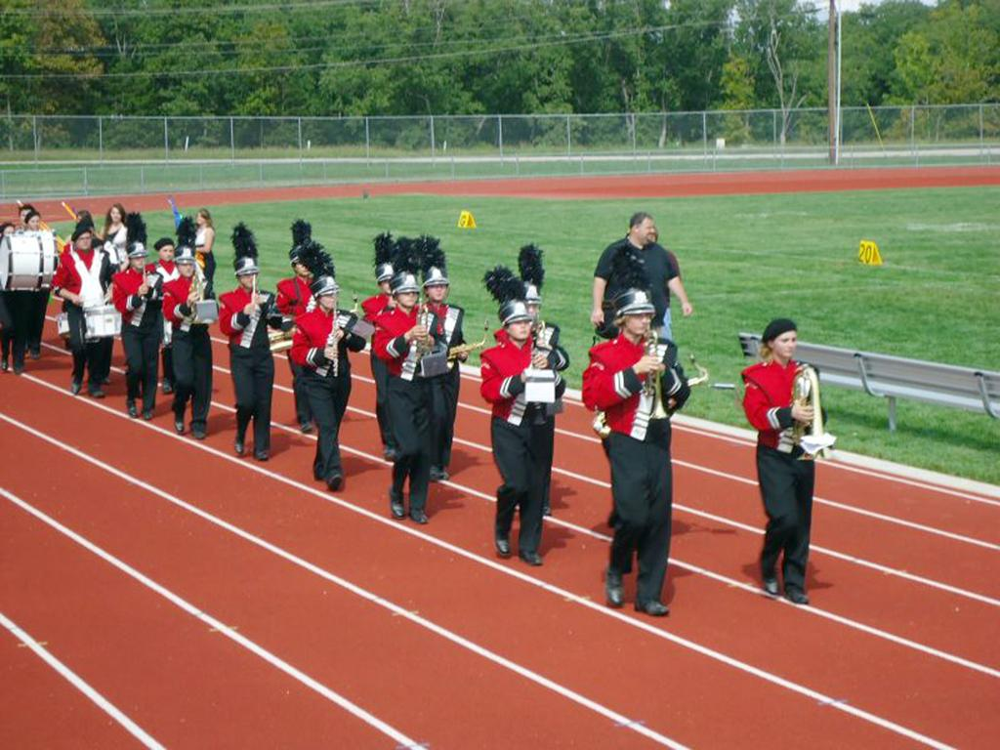

In [6]:
img = dataset["train"][2]["image"]
print(img.size)
img

In [53]:
from transformers import DetrForObjectDetection
model = DetrForObjectDetection.from_pretrained('facebook/detr-resnet-50')
#
from transformers import TrainingArguments, Trainer

training_args = TrainingArguments(
    output_dir='./detr-wider-face',
    num_train_epochs=3,
    per_device_train_batch_size=4,  # DETR can be memory intensive
    logging_dir='./logs',
    logging_steps=10,
)

# Custom data collator for DETR
from transformers import DetrDataCollator
data_collator = DetrDataCollator(return_tensors="pt")

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=dataset['train'],  # Assuming the dataset has a 'train' split
)

trainer.train()

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


ImportError: cannot import name 'DetrDataCollator' from 'transformers' (/home/matthias/Desktop/computer-vision-course/env/lib/python3.11/site-packages/transformers/__init__.py)

In [4]:
# Load the dataset
from datasets import load_dataset
dataset = load_dataset("wider_face")

# Inspect the structure of the 'faces' field in the first example
first_example = dataset['train'][0]
print(first_example['faces'])

{'bbox': [[449.0, 330.0, 122.0, 149.0]], 'blur': [0], 'expression': [0], 'illumination': [0], 'occlusion': [0], 'pose': [0], 'invalid': [False]}


In [1]:
import io
import numpy as np
from PIL import Image
from datasets import load_dataset
from transformers import DetrFeatureExtractor

# Load the dataset
dataset = load_dataset("wider_face")
dataset["dev"] = dataset["train"].train_test_split(test_size=4)["test"]

# def transform(batch):
#     new_width, new_height = 800, 600  # new, uniform width and height
#     resized_images = []
#     resized_faces = []
#     for img, faces in zip(batch['image'], batch['faces']):
#         # Check if the image is already a PIL Image, if not, convert it
#         if not isinstance(img, Image.Image):
#             img = Image.open(io.BytesIO(img))
#         orig_width, orig_height = img.size # original width and height
#         # Resize image
#         img = img.resize((new_width, new_height), Image.Resampling.LANCZOS)   
#         # Convert image back to bytes for consistency
#         img_byte_arr = io.BytesIO()
#         img.save(img_byte_arr, format='JPEG')
#         img_byte_arr = img_byte_arr.getvalue()
#         resized_images.append(img_byte_arr)
#         # Scale bounding boxes
#         scale_x = new_width / orig_width
#         scale_y = new_height / orig_height
#         scaled_bboxes = []
#         for bbox in faces['bbox']:
#             x, y, width, height = bbox
#             scaled_bbox = [x * scale_x, y * scale_y, width * scale_x, height * scale_y]
#             scaled_bboxes.append(scaled_bbox)
#         # Update the faces dictionary
#         scaled_faces_dict = faces.copy()
#         scaled_faces_dict['bbox'] = scaled_bboxes
#         resized_faces.append(scaled_faces_dict)
#     # Update the batch
#     batch['image'] = resized_images
#     batch['faces'] = resized_faces
#    return batch
def transform(batch):
    new_width, new_height = 800, 600  # Desired new width and height

    resized_images = []
    detr_bboxes = []

    for img, faces in zip(batch['image'], batch['faces']):
        # Resize image and convert to tensor
        img = Image.open(io.BytesIO(img))
        orig_width, orig_height = img.size
        img = img.resize((new_width, new_height), Image.Resampling.LANCZOS)
        img_tensor = torch.tensor(np.array(img)).permute(2, 0, 1)  # Convert to tensor
        resized_images.append(img_tensor)

        # Scale bounding boxes and convert to DETR format
        scale_x = new_width / orig_width
        scale_y = new_height / orig_height
        detr_boxes_batch = []
        for bbox in faces['bbox']:
            x_min, y_min, width, height = bbox
            x_center = (x_min + width / 2) * scale_x
            y_center = (y_min + height / 2) * scale_y
            scaled_width = width * scale_x
            scaled_height = height * scale_y
            detr_boxes_batch.append([x_center, y_center, scaled_width, scaled_height])
        detr_bboxes.append(detr_boxes_batch)

    batch['pixel_values'] = resized_images
    batch['labels'] = detr_bboxes

    return batch

# Apply the transformation
transformed_dataset = dataset.map(transform, batched=True)
transformed_dataset

Map:   0%|          | 0/12880 [00:00<?, ? examples/s]

TypeError: a bytes-like object is required, not 'JpegImageFile'

In [11]:
def transform_for_detr(batch):
    # ... (previous code for resizing images and scaling bounding boxes)
    print(batch)
    # Convert bounding boxes to DETR format
    detr_bboxes = []
    for bboxes in batch['bbox']:
        detr_boxes_batch = []
        for bbox in bboxes:
            x_center = (bbox[0] + bbox[2]) / 2 / new_width
            y_center = (bbox[1] + bbox[3]) / 2 / new_height
            width = (bbox[2] - bbox[0]) / new_width
            height = (bbox[3] - bbox[1]) / new_height
            detr_boxes_batch.append([x_center, y_center, width, height])
        detr_bboxes.append(detr_boxes_batch)

    batch['labels'] = detr_bboxes
    return batch

transformed_dataset2 = transformed_dataset.map(transform_for_detr, batched=True)
transformed_dataset2

Map:   0%|          | 0/12880 [00:00<?, ? examples/s]

{'image': [<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F1F50>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F2310>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F2690>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F29D0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F2D50>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F3110>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F3410>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F3790>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F3B10>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F3E50>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F81D0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x600 at 0x7F2BA88F

KeyError: 'bbox'

In [20]:
transformed_dataset["train"][2]["faces"]

{'bbox': [[60.9375, 172.65625, 5.46875, 6.25],
  [60.9375, 185.9375, 10.9375, 13.28125],
  [88.28125, 165.625, 8.59375, 11.71875],
  [104.6875, 203.125, 11.71875, 11.71875],
  [127.34375, 195.3125, 10.9375, 13.28125],
  [157.03125, 170.3125, 7.8125, 9.375],
  [142.1875, 207.8125, 11.71875, 13.28125],
  [191.40625, 217.96875, 14.0625, 11.71875],
  [237.5, 207.03125, 12.5, 13.28125],
  [256.25, 230.46875, 12.5, 15.625],
  [303.90625, 219.53125, 13.28125, 14.84375],
  [317.1875, 228.90625, 16.40625, 16.40625],
  [340.625, 226.5625, 17.1875, 13.28125],
  [407.8125, 256.25, 16.40625, 14.0625],
  [502.34375, 250.0, 17.96875, 17.1875],
  [510.15625, 175.0, 13.28125, 19.53125],
  [619.53125, 263.28125, 17.96875, 23.4375],
  [417.96875, 242.96875, 12.5, 13.28125],
  [22.65625, 171.875, 8.59375, 11.71875],
  [2.34375, 181.25, 8.59375, 11.71875],
  [15.625, 167.96875, 9.375, 12.5]],
 'blur': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'expression': [0, 0, 0, 0, 0, 0, 0, 0, 0

image 0 has shape (800, 600)
image 1 has shape (800, 600)
image 2 has shape (800, 600)
image 3 has shape (800, 600)
image 4 has shape (800, 600)
image 5 has shape (800, 600)
image 6 has shape (800, 600)
image 7 has shape (800, 600)
image 8 has shape (800, 600)
image 9 has shape (800, 600)


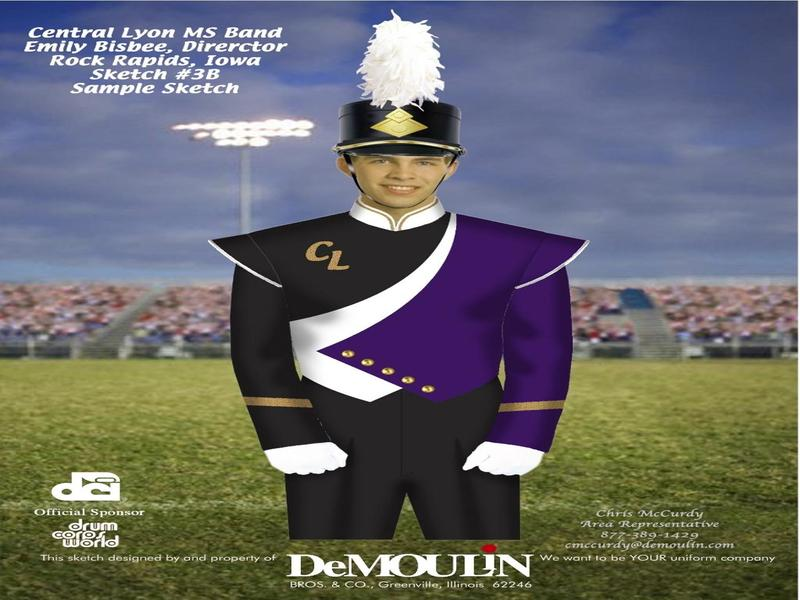

In [2]:
for i in range(10):
    print(f"image {i} has shape {transformed_dataset['train'][i]['image'].size}")
transformed_dataset['train'][0]["image"]

In [6]:
print("Number of training examples:", len(transformed_dataset['train']))

Number of training examples: 12880


In [3]:
dataset["train"]["faces"][3]["bbox"]

[[69.0, 359.0, 50.0, 36.0],
 [227.0, 382.0, 56.0, 43.0],
 [296.0, 305.0, 44.0, 26.0],
 [353.0, 280.0, 40.0, 36.0],
 [885.0, 377.0, 63.0, 41.0],
 [819.0, 391.0, 34.0, 43.0],
 [727.0, 342.0, 37.0, 31.0],
 [598.0, 246.0, 33.0, 29.0],
 [740.0, 308.0, 45.0, 33.0]]

In [4]:
from transformers import DetrForObjectDetection
model = DetrForObjectDetection.from_pretrained('facebook/detr-resnet-50')
model

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

In [5]:
from transformers import TrainingArguments, Trainer

training_args = TrainingArguments(
    output_dir='./detr-wider-face',
    num_train_epochs=3,
    per_device_train_batch_size=4,
    logging_dir='./logs',
    logging_steps=10,
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=transformed_dataset['train']
)

trainer.train()

IndexError: Invalid key: 7906 is out of bounds for size 0

In [6]:
def transform_for_detr(batch):
    # ... (previous code for resizing images)

    # Convert bounding boxes to DETR format
    for faces in resized_faces:
        for bbox in faces['bbox']:
            x_center = (bbox[0] + bbox[2] / 2) / new_width
            y_center = (bbox[1] + bbox[3] / 2) / new_height
            width = bbox[2] / new_width
            height = bbox[3] / new_height
            bbox[:] = [x_center, y_center, width, height]

    # Update the batch
    batch['image'] = resized_images
    batch['labels'] = resized_faces  # Assuming 'labels' is the correct key for DETR

    return batch

transformed_dataset_2 = transformed_dataset.map(transform_for_detr, batched=True)
transformed_dataset_2

Map:   0%|          | 0/12880 [00:00<?, ? examples/s]

NameError: name 'resized_faces' is not defined

In [3]:
from datasets import load_dataset
from transformers import DetrFeatureExtractor

# Load the dataset
dataset = load_dataset("wider_face")

# Initialize the feature extractor
feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-50')

from PIL import Image
import io
import numpy as np

def transform(batch):
    new_width, new_height = 800, 600  # Desired new width and height
    #print(batch)
    print(batch.keys)

    resized_images = []
    resized_bboxes = []

    for image, bboxes in zip(batch['image'], batch['bbox']):
        # Load image from bytes
        img = Image.open(io.BytesIO(image))
        orig_width, orig_height = img.size

        # Resize image
        img = img.resize((new_width, new_height), Image.ANTIALIAS)
        
        # Convert image back to bytes
        img_byte_arr = io.BytesIO()
        img.save(img_byte_arr, format='JPEG')
        img_byte_arr = img_byte_arr.getvalue()
        resized_images.append(img_byte_arr)

        # Scale bounding boxes
        scale_x = new_width / orig_width
        scale_y = new_height / orig_height
        scaled_bboxes = [
            [bbox[0] * scale_x, bbox[1] * scale_y, bbox[2] * scale_x, bbox[3] * scale_y] for bbox in bboxes
        ]
        resized_bboxes.append(scaled_bboxes)

    # Update the batch
    batch['image'] = resized_images
    batch['bbox'] = resized_bboxes

    return batch

# Apply the transformation
transformed_dataset = dataset.map(transform, batched=True)


dataset = dataset.map(transform, batched=True)
#dataset["dev"] = dataset["train"].train_test_split(test_size=4)["test"]
dataset

Map:   0%|          | 0/12880 [00:00<?, ? examples/s]

<bound method Mapping.keys of {'image': [<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1385 at 0x7F29C7E39710>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1432 at 0x7F29C7E3A050>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x7F29C7E34490>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x682 at 0x7F29C7E35C90>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x852 at 0x7F29C7E37210>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x931 at 0x7F29C7E375D0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x732 at 0x7F29C7E35910>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x683 at 0x7F29C7E35610>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x819 at 0x7F29C7E35450>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x7F29C7E367D0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x755 at 0x7F29C7E34350>, <PIL.JpegImagePlugin.JpegImageFil

KeyError: 'bbox'

In [1]:
from datasets import load_dataset
from transformers import DetrFeatureExtractor

# Load the dataset
dataset = load_dataset("wider_face")

# Initialize the feature extractor
feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-50')

from PIL import Image
import io
import numpy as np

def transform(batch):
    new_width, new_height = 800, 600  # Desired new width and height
    #print(batch)
    print(batch.keys)

    resized_images = []
    resized_bboxes = []

    for image, bboxes in zip(batch['image'], batch['bbox']):
        # Load image from bytes
        img = Image.open(io.BytesIO(image))
        orig_width, orig_height = img.size

        # Resize image
        img = img.resize((new_width, new_height), Image.ANTIALIAS)
        
        # Convert image back to bytes
        img_byte_arr = io.BytesIO()
        img.save(img_byte_arr, format='JPEG')
        img_byte_arr = img_byte_arr.getvalue()
        resized_images.append(img_byte_arr)

        # Scale bounding boxes
        scale_x = new_width / orig_width
        scale_y = new_height / orig_height
        scaled_bboxes = [
            [bbox[0] * scale_x, bbox[1] * scale_y, bbox[2] * scale_x, bbox[3] * scale_y] for bbox in bboxes
        ]
        resized_bboxes.append(scaled_bboxes)

    # Update the batch
    batch['image'] = resized_images
    batch['bbox'] = resized_bboxes

    return batch

# Apply the transformation
transformed_dataset = dataset.map(transform, batched=True)


dataset = dataset.map(transform, batched=True)
#dataset["dev"] = dataset["train"].train_test_split(test_size=4)["test"]
dataset

/home/matthias/Desktop/computer-vision-course/env/lib/python3.11/site-packages/transformers/models/detr/feature_extraction_detr.py:28: FutureWarning: The class DetrFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DetrImageProcessor instead.
  warnings.warn(
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


Map:   0%|          | 0/12880 [00:00<?, ? examples/s]

<bound method Mapping.keys of {'image': [<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1385 at 0x7EFF8C469890>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1432 at 0x7EFF8C47B590>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x7EFF8C47B950>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x682 at 0x7EFF8C47BD10>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x852 at 0x7EFF8C490110>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x931 at 0x7EFF8C490510>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x732 at 0x7EFF8C490850>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x683 at 0x7EFF8C490BD0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x819 at 0x7EFF8C490F50>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x7EFF8C4912D0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x755 at 0x7EFF8C491690>, <PIL.JpegImagePlugin.JpegImageFil

KeyError: 'bbox'

In [32]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'faces'],
        num_rows: 12880
    })
    test: Dataset({
        features: ['image', 'faces'],
        num_rows: 16097
    })
    validation: Dataset({
        features: ['image', 'faces'],
        num_rows: 3226
    })
    dev: Dataset({
        features: ['image', 'faces'],
        num_rows: 4
    })
})

In [29]:
i = 1 # 2: (1024, 1116)
dataset["dev"][i]["image"].size

(1024, 683)

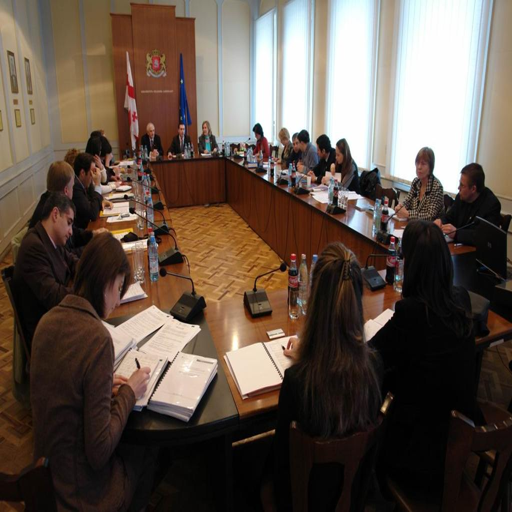

In [31]:
from PIL import Image
def resize_image(img, new_width, new_height):
    return img.resize((new_width, new_height))
#
resize_image(dataset["dev"][i]["image"], 512, 512)

In [ ]:
from PIL import Image

def resize_image(image_path, output_path, new_width, new_height):
    """
    Resizes an image to the specified width and height.

    Args:
    image_path (str): The path to the input image.
    output_path (str): The path where the resized image will be saved.
    new_width (int): The desired width of the image.
    new_height (int): The desired height of the image.
    """
    with Image.open(image_path) as img:
        # Resize the image
        img = img.resize((new_width, new_height), Image.ANTIALIAS)

        # Save the resized image
        img.save(output_path)


In [22]:
dataset["dev"][2]["faces"]["bbox"]

[[112.0, 672.0, 29.0, 40.0],
 [173.0, 766.0, 25.0, 31.0],
 [188.0, 722.0, 15.0, 18.0],
 [231.0, 663.0, 29.0, 33.0],
 [621.0, 677.0, 33.0, 37.0],
 [757.0, 669.0, 33.0, 45.0],
 [924.0, 688.0, 26.0, 31.0],
 [975.0, 697.0, 18.0, 22.0],
 [835.0, 710.0, 13.0, 18.0]]

In [3]:
from transformers import DetrForObjectDetection
model = DetrForObjectDetection.from_pretrained('facebook/detr-resnet-50')
model

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

In [4]:
from torch.utils.data import DataLoader
class CustomDetrDataCollator:
    def __call__(self, batch):
        # Implement custom collation logic here
        # This should collate images and their corresponding bounding boxes
        return batch

data_collator = CustomDetrDataCollator()
data_collator

In [5]:
from transformers import TrainingArguments, Trainer

training_args = TrainingArguments(
    output_dir='./detr-wider-face',
    num_train_epochs=3,
    per_device_train_batch_size=4,
    logging_dir='./logs',
    logging_steps=10,
)

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=dataset['train']
)

trainer.train()

IndexError: Invalid key: 7906 is out of bounds for size 0

In [3]:
from PIL import Image
import numpy as np
import torch
from datasets import load_dataset

def transform(batch):
    new_width, new_height = 800, 600  # Desired new width and height

    resized_images = []
    detr_bboxes = []

    for img, faces in zip(batch['image'], batch['faces']):
        # Check if the image is already a PIL Image, if not, convert it
        if not isinstance(img, Image.Image):
            img = Image.open(io.BytesIO(img))

        orig_width, orig_height = img.size

        # Resize image
        img = img.resize((new_width, new_height), Image.Resampling.LANCZOS)
        img_tensor = torch.tensor(np.array(img)).permute(2, 0, 1)  # Convert to tensor
        resized_images.append(img_tensor)

        # Scale bounding boxes and convert to DETR format
        scale_x = new_width / orig_width
        scale_y = new_height / orig_height
        detr_boxes_batch = []
        for bbox in faces['bbox']:
            x_min, y_min, width, height = bbox
            x_center = (x_min + width / 2) * scale_x
            y_center = (y_min + height / 2) * scale_y
            scaled_width = width * scale_x
            scaled_height = height * scale_y
            detr_boxes_batch.append([x_center, y_center, scaled_width, scaled_height])
        detr_bboxes.append(detr_boxes_batch)

    batch['pixel_values'] = resized_images
    batch['labels'] = detr_bboxes

    return batch
dataset = load_dataset("wider_face")
transformed_dataset = dataset.map(transform, batched=True)
transformed_dataset

Map:   0%|          | 0/12880 [00:00<?, ? examples/s]

KeyboardInterrupt: 

In [3]:
from datasets import load_dataset
dataset = load_dataset("Francesco/trail-camera")
dataset

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

In [4]:
i = 2
dataset["train"]

Dataset({
    features: ['image_id', 'image', 'width', 'height', 'objects'],
    num_rows: 941
})

In [5]:
dataset["train"][3]["objects"]

{'id': [572, 573],
 'area': [8325, 17887],
 'bbox': [[258.0, 280.0, 92.5, 90.0], [350.0, 259.0, 132.5, 135.0]],
 'category': [2, 2]}

In [8]:
i = 2
dataset["train"][i]

{'image_id': 633,
 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x640>,
 'width': 640,
 'height': 640,
 'objects': {'id': [1118, 1119, 1120],
  'area': [4437, 4387, 45879],
  'bbox': [[454.0, 356.0, 62.5, 71.0],
   [345.0, 365.0, 65.0, 67.5],
   [79.0, 416.0, 246.0, 186.5]],
  'category': [2, 2, 2]}}

In [11]:
dataset["train"][i]["image"]
dataset["train"][i]["objects"]["bbox"]

[[454.0, 356.0, 62.5, 71.0],
 [345.0, 365.0, 65.0, 67.5],
 [79.0, 416.0, 246.0, 186.5]]

# Start here!

In [6]:
from datasets import load_dataset
# Load the dataset
dataset = load_dataset("Francesco/trail-camera")
dataset

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

In [1]:
from transformers import DetrFeatureExtractor
import torch
from PIL import Image
import numpy as np
import io

feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-50')

def transform(batch):
    print(f"keys = {batch.keys}")
    processed_images = []
    processed_bboxes = []

    for img, annotations in zip(batch['image'], batch['objects']):
        # Convert image to tensor
        img_tensor = feature_extractor(images=img, return_tensors="pt")['pixel_values'].squeeze(0)
        processed_images.append(img_tensor)

        # Process bounding boxes
        bboxes = []
        for annotation in annotations:
            # DETR expects [x_center, y_center, width, height]
            print(annotation)
            print(annotation.keys)
            x_center = (annotation['bbox'][0] + annotation['bbox'][2] / 2)
            y_center = (annotation['bbox'][1] + annotation['bbox'][3] / 2)
            width = annotation['bbox'][2]
            height = annotation['bbox'][3]
            bboxes.append([x_center, y_center, width, height])
        processed_bboxes.append(bboxes)

    batch['pixel_values'] = processed_images
    batch['labels'] = processed_bboxes
    return batch

# Apply the transformation
dataset = 
transformed_dataset = dataset.map(transform, batched=True)
transformed_dataset

/home/matthias/Desktop/computer-vision-course/env/lib/python3.11/site-packages/transformers/models/detr/feature_extraction_detr.py:28: FutureWarning: The class DetrFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DetrImageProcessor instead.
  warnings.warn(
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


NameError: name 'dataset' is not defined

In [10]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

In [7]:
from transformers import DetrFeatureExtractor
import torch
from datasets import load_dataset
from PIL import Image
import numpy as np
import io

dataset = load_dataset("Francesco/trail-camera")
print(dataset)

feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-50')

def transform(batch):
    print(len(batch))
    processed_images = []
    processed_bboxes = []
    for img, annotations in zip(batch['image'], batch['objects']):
        print(img)
        print(annotations)
        # Convert image to tensor
        if not isinstance(img, Image.Image):
            img = Image.open(io.BytesIO(img))
        img_tensor = feature_extractor(images=img, return_tensors="pt")['pixel_values'].squeeze(0)
        print(img_tensor.shape)
        processed_images.append(img_tensor)
        # Process bounding boxes
        bboxes = []
        for annotation in annotations:
            print(f"annotation = {annotation}") # => annotation = id (string) 
            print(f"type: {type(annotation)}")
            #print(f"keys: {type(annotation.keys)}")
            print(f"annotation: {annotation}")
            # DETR expects [x_center, y_center, width, height]
            x_center = (annotation['bbox'][0] + annotation['bbox'][2] / 2)
            y_center = (annotation['bbox'][1] + annotation['bbox'][3] / 2)
            width = annotation['bbox'][2]
            height = annotation['bbox'][3]
            bboxes.append([x_center, y_center, width, height])
        processed_bboxes.append(bboxes)

    batch['pixel_values'] = processed_images
    batch['labels'] = processed_bboxes
    return batch

# Apply the transformation
transformed_dataset = dataset.map(transform, batched=True)
transformed_dataset

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})


Map:   0%|          | 0/941 [00:00<?, ? examples/s]

5
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x640 at 0x7F6A26EA9250>
{'id': [], 'area': [], 'bbox': [], 'category': []}
torch.Size([3, 800, 800])
annotation = id
type: <class 'str'>
annotation: id


TypeError: string indices must be integers, not 'str'

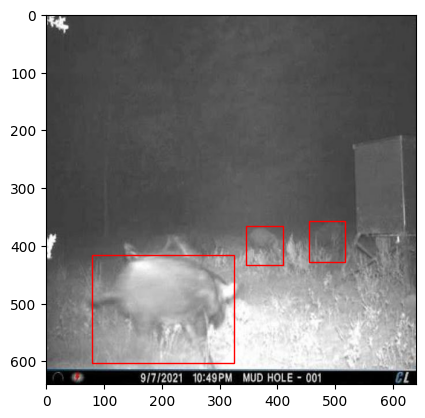

In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from datasets import load_dataset

dataset = load_dataset("Francesco/trail-camera")

def plot_img_bboxes(img, bboxes):
    fig, ax = plt.subplots() # instantiate axes
    ax.imshow(img)           # image background
    for bbox in bboxes:      # bounding boxes
        # DETR uses 800x800 min => multiply 640x640 and all lengths by 800/640=5/4=1.25
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show
    pass

i = 2
plot_img_bboxes(dataset["train"][i]["image"], dataset["train"][i]["objects"]["bbox"])

In [2]:
dataset # check for each split whether all instances have the same shape (640 x 640)!!!

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

In [13]:
img = dataset["train"][2]["image"]
img.size

(640, 640)

In [19]:
800/640

1.25

In [20]:
5/4

1.25

In [18]:
from transformers import DetrFeatureExtractor
feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-50')
img = dataset["train"][2]["image"]
print(img.size)
img_tensor = feature_extractor(images=img, return_tensors="pt")['pixel_values'].squeeze(0)
print(img_tensor.shape)
img_tensor

(640, 640)
torch.Size([3, 800, 800])


tensor([[[ 2.0263,  2.1119,  1.9407,  ..., -1.1418, -1.1075, -1.0733],
         [ 2.1119,  2.0092,  1.6838,  ..., -1.1247, -1.1075, -1.0733],
         [ 2.1290,  1.7865,  1.2728,  ..., -1.1247, -1.1075, -1.0904],
         ...,
         [-2.1008, -2.0837, -2.0837,  ..., -2.0665, -2.0152, -1.9638],
         [-2.1008, -2.0837, -2.0837,  ..., -2.0665, -2.0152, -1.9467],
         [-2.1008, -2.0837, -2.0837,  ..., -2.0665, -2.0152, -1.9467]],

        [[ 2.2010,  2.2885,  2.1134,  ..., -1.0378, -1.0028, -0.9678],
         [ 2.2885,  2.1835,  1.8508,  ..., -1.0203, -1.0028, -0.9678],
         [ 2.3060,  1.9559,  1.4307,  ..., -1.0203, -1.0028, -0.9853],
         ...,
         [-2.0182, -2.0007, -2.0007,  ..., -1.9832, -1.9307, -1.8782],
         [-2.0182, -2.0007, -2.0007,  ..., -1.9832, -1.9307, -1.8606],
         [-2.0182, -2.0007, -2.0007,  ..., -1.9832, -1.9307, -1.8606]],

        [[ 2.4134,  2.5006,  2.3263,  ..., -0.8110, -0.7761, -0.7413],
         [ 2.5006,  2.3960,  2.0648,  ..., -0

In [ ]:
feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-50')

    for img, annotations in zip(batch['image'], batch['annotations']):
        # Convert image to tensor
        img_tensor = feature_extractor(images=img, return_tensors="pt")['pixel_values'].squeeze(0)

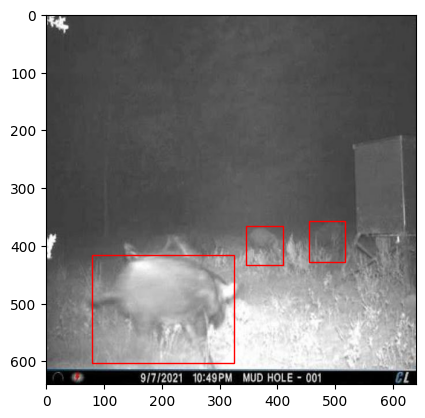

In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from datasets import load_dataset

dataset = load_dataset("Francesco/trail-camera")

def plot_img_bboxes(img, bboxes):
    fig, ax = plt.subplots() # instantiate axes
    ax.imshow(img)           # image background
    for bbox in bboxes:      # bounding boxes
        # DETR uses 800x800 min => multiply 640x640 and all lengths by 800/640=5/4=1.25
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show
    pass

i = 2
plot_img_bboxes(dataset["train"][i]["image"], dataset["train"][i]["objects"]["bbox"])

In [28]:
from PIL import Image
import numpy as np
import torch
from datasets import load_dataset

dataset = load_dataset("Francesco/trail-camera")
dataset

from PIL import Image
import numpy as np
import torch
import io

from PIL import Image
import numpy as np
import torch
import io

def preprocess_image(image_data, target_size=(800, 800)):
    """
    Preprocess the image: duplicate grayscale channels, resize, and convert to tensor.
    """
    # Convert byte data to PIL Image
    image = Image.open(io.BytesIO(image_data))

    # Convert single-channel grayscale to three-channel
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Resize image
    image = image.resize(target_size)

    # Convert to tensor
    image_tensor = torch.tensor(np.array(image)).permute(2, 0, 1)  # Convert to tensor (C, H, W format)
    return image_tensor

def resize_bbox(bbox, orig_size, target_size=(800, 800)):
    """
    Resize bounding box coordinates based on the original and target image sizes.
    """
    x_scale = target_size[0] / orig_size[0]
    y_scale = target_size[1] / orig_size[1]

    # Rescale each coordinate
    resized_bbox = [bbox[0] * x_scale, bbox[1] * y_scale, bbox[2] * x_scale, bbox[3] * y_scale]
    return resized_bbox

def preprocess_batch(batch, target_size=(800, 800)):
    """
    Preprocess a batch of images and bounding boxes.
    """
    processed_images = []
    processed_bboxes = []

    for image_data, bbox_data in zip(batch['image'], batch['annotations']):
        # Extract the actual image bytes
        if isinstance(image_data, dict):
            image_bytes = image_data['image']
        else:
            image_bytes = image_data.numpy() if hasattr(image_data, 'numpy') else image_data

        # Process the image
        processed_image = preprocess_image(image_bytes, target_size)
        processed_images.append(processed_image)

        orig_size = Image.open(io.BytesIO(image_bytes)).size

        # Resize bounding boxes
        processed_bbox = [resize_bbox(bbox, orig_size, target_size) for bbox in bbox_data]
        processed_bboxes.append(processed_bbox)

    return {'pixel_values': processed_images, 'labels': processed_bboxes}



transformed_dataset = dataset.map(preprocess_data, batched=True)
#transformed_dataset = dataset.map(lambda x: print(x))
transformed_dataset

Map:   0%|          | 0/941 [00:00<?, ? examples/s]

TypeError: a bytes-like object is required, not 'LazyBatch'

In [3]:
transformed_dataset

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

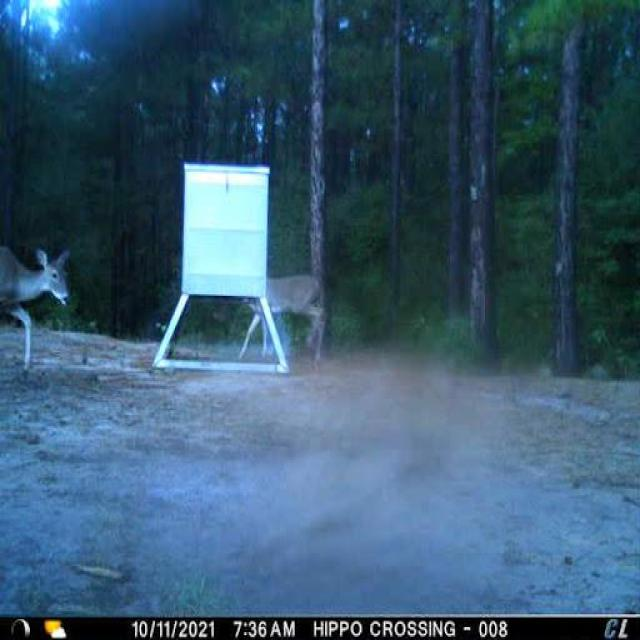

In [7]:
transformed_dataset["validation"][0]["image"]

In [11]:
transformed_dataset["validation"][0]["image"].size

(640, 640)

In [43]:
from PIL import Image
import numpy as np
import torch
import io

def preprocess_image(image_data, target_size=(800, 800)):
    """
    Preprocess the image: duplicate grayscale channels, resize, and convert to tensor.
    """
    # Convert byte data to PIL Image
    image = Image.open(io.BytesIO(image_data))

    # Convert single-channel grayscale to three-channel
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Resize image
    image = image.resize(target_size)

    # Convert to tensor
    image_tensor = torch.tensor(np.array(image)).permute(2, 0, 1)  # Convert to tensor (C, H, W format)
    return image_tensor

def resize_bbox(bbox, orig_size, target_size=(800, 800)):
    """
    Resize bounding box coordinates based on the original and target image sizes.
    """
    x_scale = target_size[0] / orig_size[0]
    y_scale = target_size[1] / orig_size[1]

    # Rescale each coordinate
    resized_bbox = [bbox[0] * x_scale, bbox[1] * y_scale, bbox[2] * x_scale, bbox[3] * y_scale]
    return resized_bbox

def preprocess_instance(instance, target_size=(800, 800)):
    """
    Preprocess a single image and its bounding boxes.
    """
    image_data = instance['image']
    bbox_data = instance["objects"]['bbox']

    processed_image = preprocess_image(image_data, target_size)
    orig_size = Image.open(io.BytesIO(image_data)).size
    processed_bboxes = [resize_bbox(bbox, orig_size, target_size) for bbox in bbox_data]

    return {'pixel_values': processed_image, 'labels': processed_bboxes}
#

from datasets import load_dataset

# Load the dataset
dataset = load_dataset("Francesco/trail-camera")

# Apply the preprocessing function to each instance
transformed_dataset = dataset.map(preprocess_instance, batched=False)
transformed_dataset

Map:   0%|          | 0/941 [00:00<?, ? examples/s]

TypeError: a bytes-like object is required, not 'JpegImageFile'

In [39]:
dataset["train"][2]["objects"]["bbox"]

{'id': [1118, 1119, 1120],
 'area': [4437, 4387, 45879],
 'bbox': [[454.0, 356.0, 62.5, 71.0],
  [345.0, 365.0, 65.0, 67.5],
  [79.0, 416.0, 246.0, 186.5]],
 'category': [2, 2, 2]}

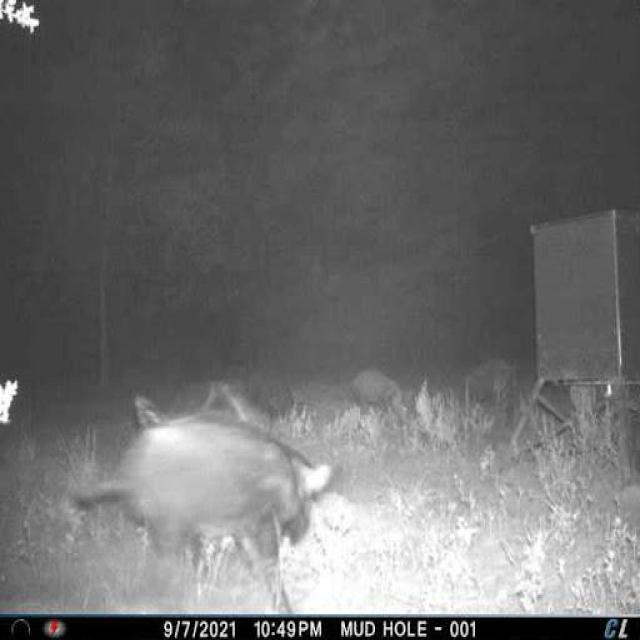

In [50]:
img = dataset["train"][2]["image"]
img

In [47]:
bytearray(img)

TypeError: cannot convert 'JpegImageFile' object to bytearray

In [48]:
Image.open(io.BytesIO(img))

TypeError: a bytes-like object is required, not 'JpegImageFile'

In [55]:
from PIL import Image
import io
from datasets import load_dataset

# Open the image
#image_path = img
#image = Image.open(image_path)
dataset = load_dataset("Francesco/trail-camera")
image = dataset["train"][2]["image"]

# Convert the image to a byte array
byte_array = io.BytesIO()
image.save(byte_array, format='PNG')
image_bytes = byte_array.getvalue()

# Now, image_bytes is a byte array representation of the JPEG image
image_bytes

b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\x80\x00\x00\x02\x80\x08\x02\x00\x00\x00\x83\xaf^t\x00\x01\x00\x00IDATx\x9c\xec\xbd\xdb\x92$9\x92%\x06xxD^\xea^]\xd3\xb7\xe9\xe9\xe1\x90\xdc\xd9]!\x9f(BR\x84"\xbb\xff\xc7\x8f\xe0GP\xf8\x0b\xa4\xece(\xbb/\x14\x92\xcd\xd9\xda\xe6\xb2\xef\xddu\xc9\xaa\xca\xaa\xcc\x8c\x8b\x83\x0f\x18\xd7>v\x8e\xaa\x1a\xcc\xdc<"r\xba\xf5!\xc4\xc2\x1c\xa6P(T\x8f*`\x00\xac~\xfd\xf5\xd7O\x9e<\xf9\xcdo~\xf3\xbf\xff\xef\xff\xfb\xff\xf4?\xfdO\x7f\xf9\x97\x7f\xf9\xfe\xfb\xef\xff\xf4\xa7?\xfd\xdb\xbf\xfd\xdb\x7f\xf9/\xff\xe5\x93\'O\xf6\xfb})\xe5\x8b/\xbe\xf8\xee\xbb\xefnoo\xff\xc7\xff\xf1\x7f\xfc\x8f\xff\xf1?\xde\xdd\xdd\xfd\xe67\xbf\xf9\xcb\xbf\xfc\xcb\xdf\xff\xfe\xf7?\xfa\xd1\x8f...\xbe\xf9\xe6\x9b\xa7O\x9f\xee\xf7\xfb\xdb\xdb\xdb\x9b\x9b\x9bR\xca\xe1p8\x1c\x0e\x17\x17\x17\x1f|\xf0\xc1\xaf\x7f\xfd\xeb\xa7O\x9f\xde\xdc\xdc\xf4\x02\xad\xb5w\xdey\xa7xTkm\xad\x1d\x0e\x87\xd6Z\xffw\xb7\xdb\xd5Z\xdd\xc2\xa5\x94^\xac\x97\xb4\xbf\x1bR\xc2\x1f\xef\xf4b\r\x08\x85\xdf\xedv\xc

In [57]:
import numpy
import PIL

img = PIL.Image.open(image).convert("L")
imgarr = numpy.array(img)
imgarr

AttributeError: 'JpegImageFile' object has no attribute 'read'

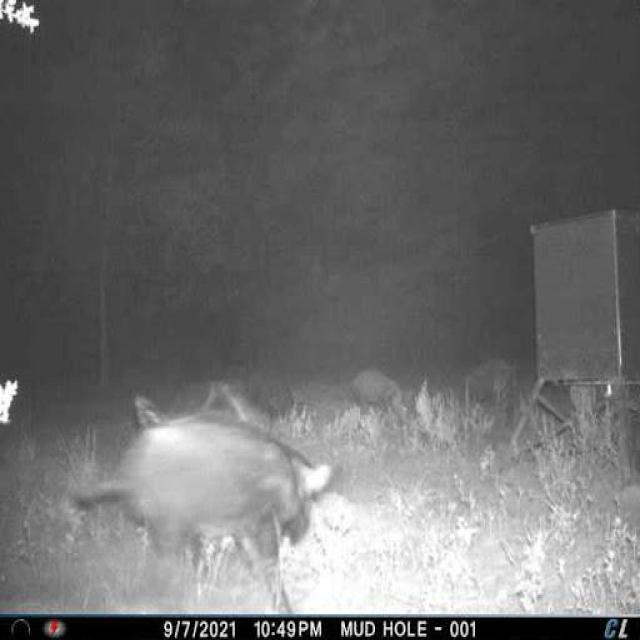

In [58]:
img

In [59]:
pic = Image.open(img)
pix = numpy.array(pic.getdata()).reshape(pic.size[0], pic.size[1], 3)
pix

AttributeError: 'JpegImageFile' object has no attribute 'read'

In [1]:
%matplotlib inline
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from datasets import load_dataset
from transformers import DetrFeatureExtractor
dataset = load_dataset("Francesco/trail-camera")
dataset

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

In [2]:
img = dataset["train"][2]["image"]
img.size

(640, 640)

In [3]:
feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-50')
img_tensor = feature_extractor(images=img, return_tensors="pt")['pixel_values'].squeeze(0)
img_tensor.shape

/home/matthias/Desktop/computer-vision-course/env/lib/python3.11/site-packages/transformers/models/detr/feature_extraction_detr.py:28: FutureWarning: The class DetrFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DetrImageProcessor instead.
  warnings.warn(
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


torch.Size([3, 800, 800])

In [4]:
bboxes = dataset["train"]["objects"][2]["bbox"]
bboxes

[[454.0, 356.0, 62.5, 71.0],
 [345.0, 365.0, 65.0, 67.5],
 [79.0, 416.0, 246.0, 186.5]]

In [5]:
def scale_bboxes(example):
    # must receive and return an example
    print(example["objects"])
    bboxes = example["objects"]["bbox"]
    bboxes800 = []
    for bbox in bboxes:
        bbox800 = []
        for value in bbox:
            bbox800.append(value*800/640)
        bboxes800.append(bbox800)
    #bboxes800 = torch.tensor(bboxes800)#.unsqueeze(1)
    bboxes800 = torch.tensor(bboxes800).unsqueeze(1)
    example["objects"]["bbox"] = bboxes800
    return example

updated_dataset = dataset.map(scale_bboxes).remove_columns(["image_id", "width", "height"])
updated_dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image', 'objects'],
        num_rows: 239
    })
})

In [6]:
updated_dataset["train"]["objects"][2]["bbox"]

[[[567.5, 445.0, 78.125, 88.75]],
 [[431.25, 456.25, 81.25, 84.375]],
 [[98.75, 520.0, 307.5, 233.125]]]

[[218.75, 356.25, 132.5, 116.875]]
[[353.75, 382.5, 68.75, 78.125]]
[[463.75, 383.75, 84.375, 88.75]]
[[618.75, 400.0, 63.75, 66.25]]
[[0.0, 343.75, 170.0, 381.875]]


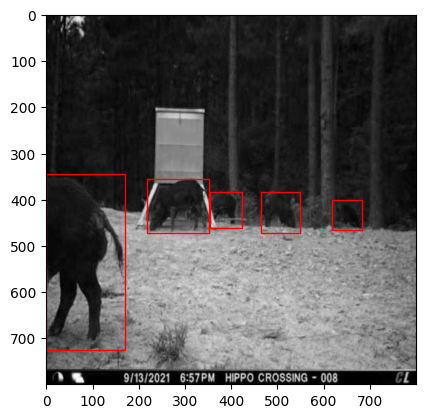

In [23]:
def plot_img_bboxes(img, bboxes):
    fig, ax = plt.subplots()                                    # instantiate axes
    img_tensor = feature_extractor(images=img, return_tensors="pt")['pixel_values'].squeeze(0)
    ax.imshow(img_tensor[0], cmap="gray")                       # image background
    for bbox in bboxes: #updated_dataset["train"]["objects"][2]["bbox"]: # bounding boxes
        print(bbox)
        rect = patches.Rectangle((bbox[0][0], bbox[0][1]), bbox[0][2], bbox[0][3], linewidth=1, edgecolor="r", facecolor="none")
        ax.add_patch(rect)
    plt.show
    pass

i = 7
plot_img_bboxes(updated_dataset["train"][i]["image"], updated_dataset["train"][i]["objects"]["bbox"])
#dataset["train"][i]["objects"]["bbox"]

In [14]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    return tuple(zip(*batch))

# Create the DataLoader
train_loader = DataLoader(dataset['train'], batch_size=4, shuffle=True, collate_fn=collate_fn)
train_loader

In [15]:
from transformers import DetrForObjectDetection, DetrConfig
# Load the pre-trained DETR model
config = DetrConfig.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection(config)
model

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

In [17]:
import torch.optim as optim
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
optimizer

AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0.01
)

In [40]:
i = 3
updated_dataset["train"][i]["objects"]["bbox"]

[[[322.5, 350.0, 115.625, 112.5]], [[437.5, 323.75, 165.625, 168.75]]]

In [18]:
num_epochs = 10  # Set the number of epochs

for epoch in range(num_epochs):
    model.train()
    for images, targets in train_loader:
        # Move data to the appropriate device (e.g., GPU)
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(images=images, targets=targets)
        losses = sum(loss for loss in loss_dict.values())

        # Backward pass
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        print(f"Epoch {epoch}, Loss: {losses.item()}")

ValueError: too many values to unpack (expected 2)

In [8]:
from PIL import Image
import torch
import io

def transform(example):
    # Convert image to tensor
    image = Image.open(io.BytesIO(example['image'])).convert('RGB')
    image = transforms.ToTensor()(image)

    # Adjust bounding boxes if necessary
    # Assuming example['objects']['bbox'] is in the format [x, y, width, height]
    boxes = example['objects']['bbox']
    boxes = [[x, y, x + width, y + height] for x, y, width, height in boxes]
    boxes = torch.tensor(boxes, dtype=torch.float32)

    return {'image': image, 'boxes': boxes}


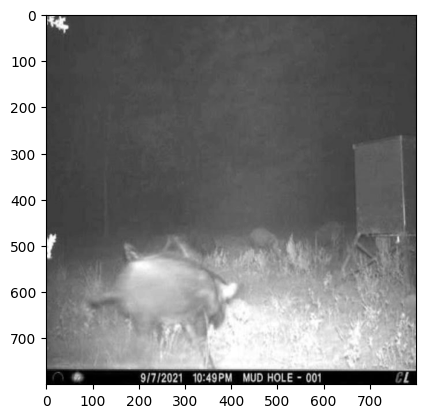

In [7]:
# show scaled image with bounding boxes
img_array = np.array(img_tensor[0])
plt.imshow(img_array, cmap="gray")
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from datasets import load_dataset

dataset = load_dataset("Francesco/trail-camera")

def plot_img_bboxes(img, bboxes):
    fig, ax = plt.subplots() # instantiate axes
    ax.imshow(img)           # image background
    for bbox in bboxes:      # bounding boxes
        # DETR uses 800x800 min => multiply 640x640 and all lengths by 800/640=5/4=1.25
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show
    pass

i = 2
plot_img_bboxes(dataset["train"][i]["image"], dataset["train"][i]["objects"]["bbox"])

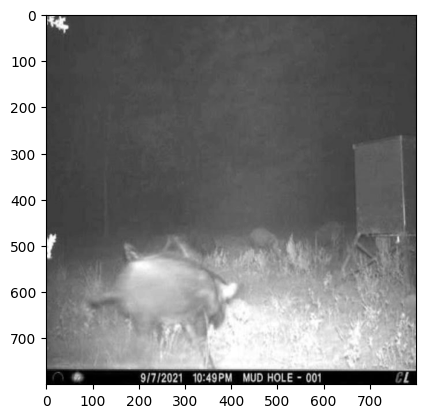

In [23]:
# show scaled image with bounding boxes
img_tensor_0 = img_tensor[0]
plt.imshow(img_tensor_0, cmap="gray")
plt.show()

In [15]:
from PIL import Image
import numpy as np
img = Image.open(img_tensor.numpy()).convert("L")
img

AttributeError: 'numpy.ndarray' object has no attribute 'read'

In [14]:
type(img_tensor)

torch.Tensor

TypeError: Invalid shape (3, 800, 800) for image data

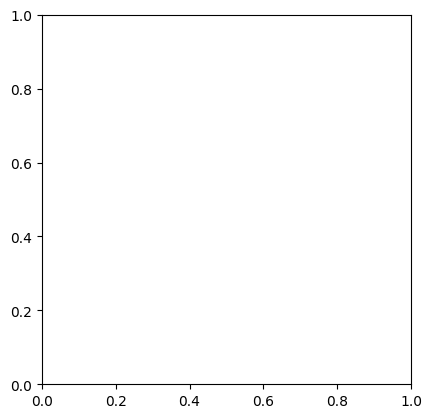

In [9]:
#%matplotlib inline
fig, ax = plt.subplots() # instantiate axes
ax.imshow(img_tensor)           # image background
plt.show

In [10]:
i = 2
img_tensor = updated_dataset["train"][2]["image"]#.keys
#print(img_tensor.keys)
type(img_tensor)

PIL.JpegImagePlugin.JpegImageFile

In [11]:
fig, ax = plt.subplots() # instantiate axes
    ax.imshow(img_tensor)           # image background
    for bbox in bboxes:      # bounding boxes
        # DETR uses 800x800 min => multiply 640x640 and all lengths by 800/640=5/4=1.25
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show

IndentationError: unexpected indent (2093502923.py, line 2)

In [12]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image





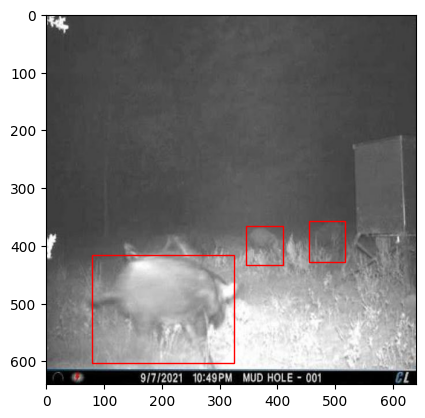

In [13]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from datasets import load_dataset

#dataset = load_dataset("Francesco/trail-camera")

def plot_img_bboxes(img, bboxes):
    fig, ax = plt.subplots() # instantiate axes
    ax.imshow(img)           # image background
    for bbox in bboxes:      # bounding boxes
        # DETR uses 800x800 min => multiply 640x640 and all lengths by 800/640=5/4=1.25
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show
    pass

i = 2
plot_img_bboxes(dataset["train"][i]["image"], dataset["train"][i]["objects"]["bbox"])

In [14]:
bboxes800 = []
for bbox in bboxes:
    bbox800 = []
    for p in bbox:
        bbox800.append(p*800/640)
    bboxes800.append(bbox800)
#bboxes800 = torch.tensor(bboxes800)#.unsqueeze(1)
bboxes800

[[567.5, 445.0, 78.125, 88.75],
 [431.25, 456.25, 81.25, 84.375],
 [98.75, 520.0, 307.5, 233.125]]

In [15]:
updated_dataset["train"]["objects"][2]["bbox"]

[[567.5, 445.0, 78.125, 88.75],
 [431.25, 456.25, 81.25, 84.375],
 [98.75, 520.0, 307.5, 233.125]]

In [16]:
dataset.map(lambda example: example)

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

In [24]:
dataset.map(lambda example: scale_bboxes(example["objects"]["bbox"]))

SyntaxError: invalid syntax (1510663131.py, line 1)

In [ ]:
updated_dataset = dataset.map(lambda example: {"new_sentence": example["sentence1"]}, remove_columns=["sentence1"])
updated_dataset.column_names

In [15]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

In [13]:
dataset["train"]["objects"]

[{'id': [], 'area': [], 'bbox': [], 'category': []},
 {'id': [1351],
  'area': [24764],
  'bbox': [[15.0, 227.0, 164.0, 151.0]],
  'category': [1]},
 {'id': [1118, 1119, 1120],
  'area': [4437, 4387, 45879],
  'bbox': [[454.0, 356.0, 62.5, 71.0],
   [345.0, 365.0, 65.0, 67.5],
   [79.0, 416.0, 246.0, 186.5]],
  'category': [2, 2, 2]},
 {'id': [572, 573],
  'area': [8325, 17887],
  'bbox': [[258.0, 280.0, 92.5, 90.0], [350.0, 259.0, 132.5, 135.0]],
  'category': [2, 2]},
 {'id': [692],
  'area': [6853],
  'bbox': [[148.0, 299.0, 89.0, 77.0]],
  'category': [2]},
 {'id': [410, 411],
  'area': [19106, 27357],
  'bbox': [[0.0, 237.0, 82.0, 233.0], [423.0, 266.0, 155.0, 176.5]],
  'category': [1, 1]},
 {'id': [685, 686],
  'area': [4865, 1892],
  'bbox': [[87.0, 316.0, 69.5, 70.0], [285.0, 394.0, 43.0, 44.0]],
  'category': [2, 2]},
 {'id': [1352, 1353, 1354, 1355, 1356],
  'area': [9911, 3437, 4792, 2703, 41548],
  'bbox': [[175.0, 285.0, 106.0, 93.5],
   [283.0, 306.0, 55.0, 62.5],
   [37

In [6]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 941
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 131
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 239
    })
})

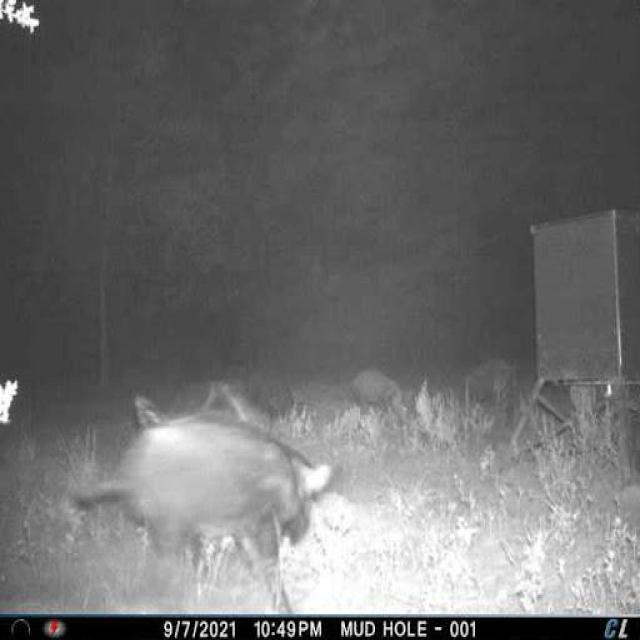

In [9]:
dataset["train"]["image"][2]

In [10]:
img_tensor = torch.tensor(feature_extractor(dataset["train"]["image"][0])["pixel_values"][0])
print(img_tensor.shape)
img_tensor

torch.Size([3, 800, 800])


tensor([[[-1.1932, -1.1932, -1.1932,  ..., -1.1589, -1.1589, -1.1589],
         [-1.1932, -1.1932, -1.1932,  ..., -1.1589, -1.1589, -1.1589],
         [-1.1932, -1.1932, -1.1932,  ..., -1.1589, -1.1589, -1.1589],
         ...,
         [-2.0152, -2.0152, -2.0152,  ..., -2.0837, -2.0665, -2.0494],
         [-2.0152, -2.0152, -2.0152,  ..., -2.0494, -2.0323, -2.0152],
         [-2.0152, -2.0152, -2.0152,  ..., -2.0152, -1.9809, -1.9638]],

        [[-1.0903, -1.0903, -1.0903,  ..., -1.0553, -1.0553, -1.0553],
         [-1.0903, -1.0903, -1.0903,  ..., -1.0553, -1.0553, -1.0553],
         [-1.0903, -1.0903, -1.0903,  ..., -1.0553, -1.0553, -1.0553],
         ...,
         [-1.9307, -1.9307, -1.9307,  ..., -2.0007, -1.9832, -1.9657],
         [-1.9307, -1.9307, -1.9307,  ..., -1.9657, -1.9482, -1.9307],
         [-1.9307, -1.9307, -1.9307,  ..., -1.9307, -1.8957, -1.8782]],

        [[-0.8633, -0.8633, -0.8633,  ..., -0.8284, -0.8284, -0.8284],
         [-0.8633, -0.8633, -0.8633,  ..., -0

In [ ]:
def scaleImage(example):
    image = example["image"]
    example["image2"] = feature_extractor(images=example["image"], return_tensors="pt")["pixel_values"]#.squeeze(0)
    example["image2"] = image
    return example
#
dataset.map(scaleImage, batched=True)
dataset

Map:   0%|          | 0/941 [00:00<?, ? examples/s]

In [ ]:
def add_prefix(example):
    example["sentence1"] = 'My sentence: ' + example["sentence1"]
    return example

In [ ]:
updated_dataset = dataset.map(lambda example: {"new_sentence": example["sentence1"]}, remove_columns=["sentence1"])
updated_dataset

In [15]:
updated_dataset = dataset.map(lambda x: 3)
updated_dataset

Map:   0%|          | 0/941 [00:00<?, ? examples/s]

TypeError: Provided `function` which is applied to all elements of table returns a variable of type <class 'int'>. Make sure provided `function` returns a variable of type `dict` (or a pyarrow table) to update the dataset or `None` if you are only interested in side effects.

In [7]:
dataset["image800"] = dataset.map(
    lambda dataset["image"]: feature_extractor(images=dataset["image"], return_tensors="pt")['pixel_values'].squeeze(0)
)
dataset

SyntaxError: invalid syntax (3306604304.py, line 2)

In [8]:
lambda x: 2*x

<function __main__.<lambda>(x)>